# MNE tutorial - Preprocessing
用python的MNE包预处理MEG数据

安装MNE包：pip install mne 

参考：https://mne.tools/stable/auto_tutorials/preprocessing/index.html

有疑问、不清楚函数的具体用途，可以进入参考网址查看，里面提供了详细的函数作用、参数设置以及使用示例



-----

用MNE是因为比较方便，可以先用MNE的做预处理，后续再看如何用pyhton包或者docker来使用Brainstorm

这些代码我自己跑过，但由于package版本等问题，如果报错可以试着调整一下代码

很多内容只是为了方便理解，实际只需要运行部分代码就能达到我们的目的了

----
内容包括
- 坏道剔除（优先）
- 检测伪迹
- 修复伪迹

In [75]:
import os
import numpy as np
import matplotlib.pyplot as plt

In [349]:
import mne
from mne.preprocessing import (
    compute_proj_ecg,
    compute_proj_eog,
    create_ecg_epochs,
    create_eog_epochs,
)

## Example：用MNE读取MEG数据
----

CTF 数据通常是一个包含多个文件的文件夹（如 .meg4、.res4 等），而不是单个文件。

ds directory : /data/proj_A/sub-0001/ses-01/meg/sub-0001_ses-01_task-noise_run-02_meg.ds
    res4 data read.
    hc data read.
    Separate EEG position data file not present.
    Quaternion matching (desired vs. transformed):
       0.00   80.00    0.00 mm <->    0.00   80.00    0.00 mm (orig :  -56.57   56.57 -270.00 mm) diff =    0.000 mm
       0.00  -80.00    0.00 mm <->    0.00  -80.00    0.00 mm (orig :   56.57  -56.57 -270.00 mm) diff =    0.000 mm
      80.00    0.00    0.00 mm <->   80.00   -0.00    0.00 mm (orig :   56.57   56.57 -270.00 mm) diff =    0.000 mm
    Coordinate transformations established.
    Polhemus data for 3 HPI coils added
    Device coordinate locations for 3 HPI coils added
    Measurement info composed.
Finding samples for /data/proj_A/sub-0001/ses-01/meg/sub-0001_ses-01_task-noise_run-02_meg.ds/sub-0001_ses-01_task-noise_run-02_meg.meg4: 
    System clock channel is available, checking which samples are valid.
    150 x 4800 = 720000 samples from 297 

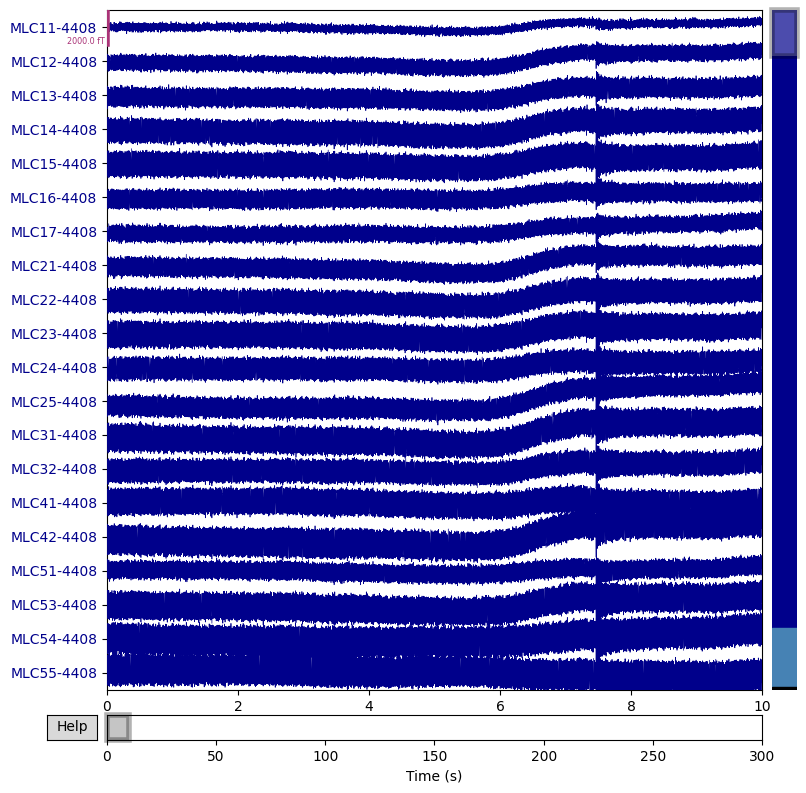

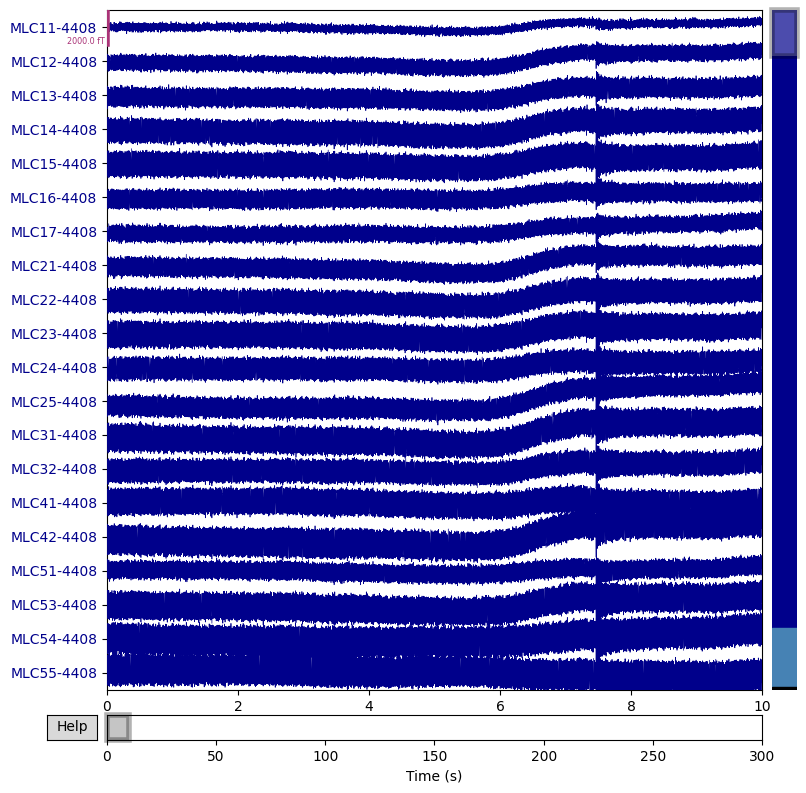

In [45]:
# MEG 数据路径
path = '/data/proj_A/sub-0001/ses-01/meg/sub-0001_ses-01_task-noise_run-02_meg.ds'

# 读取 .ds 文件
raw = mne.io.read_raw_ctf(path, preload=True)

print('-----------------------------------------------')
# 查看数据信息
print(raw.info)
print('-----------------------------------------------')
data, times = raw[:, :]  # 获取所有通道的所有数据点
print('数据的大小为：',data.shape)  # 数据形状为 (n_channels, n_times)
print('-----------------------------------------------')
# 绘制原始数据
raw.plot()

In [18]:
raw

Measurement date,"January 01, 2000 09:48:00 GMT"
Experimenter,Unknown
Participant,sub-0001
Digitized points,3 points
Good channels,"1 misc, 26 Reference Magnetometers, 270 Magnetometers"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,2400.00 Hz
Highpass,0.00 Hz
Lowpass,1200.00 Hz


## 剔除坏道
---
- 手动剔除坏道
- 自动识别插值

### 查看坏道信号

In [401]:
## 示例数据
sample_data_folder = mne.datasets.sample.data_path()
sample_data_raw_file = os.path.join(sample_data_folder, "MEG", "sample", "sample_audvis_raw.fif")
raw = mne.io.read_raw_fif(sample_data_raw_file, verbose=False)
## 数据包含坏道信息
print('坏道位置：',raw.info["bads"])

坏道位置： ['MEG 2443', 'EEG 053']


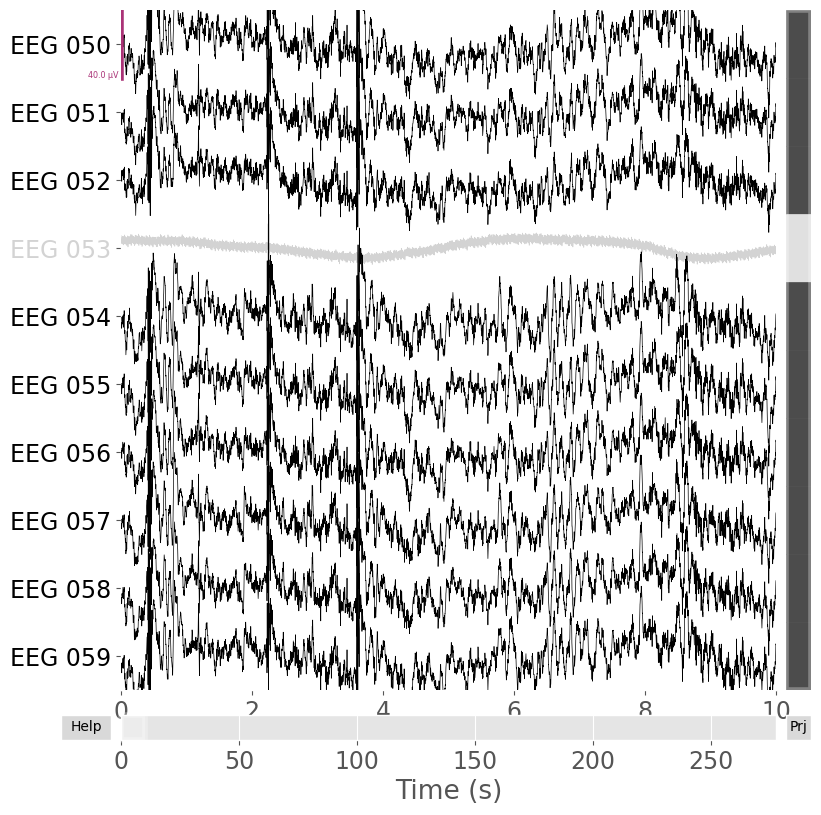

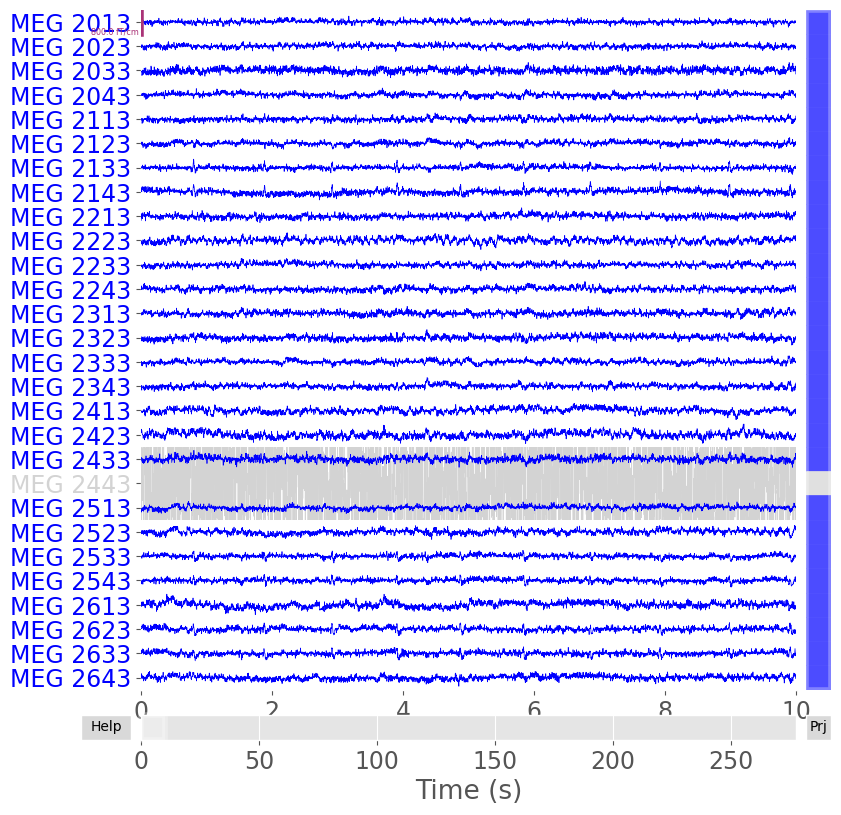

In [402]:
## 查看坏道信号
picks = mne.pick_channels_regexp(raw.ch_names, regexp="EEG 05.")
raw.plot(order=picks, n_channels=len(picks))
plt.show()

picks = mne.pick_channels_regexp(raw.ch_names, regexp="MEG 2..3")
raw.plot(order=picks, n_channels=len(picks))
plt.show()
## raw.info["bads"]可以编辑，我们可以在其中添加信息

320 events found on stim channel STI 014
Event IDs: [ 1  2  3  4  5 32]
Not setting metadata
320 matching events found
Setting baseline interval to [-0.19979521315838786, 0.0] s
Applying baseline correction (mode: mean)
Created an SSP operator (subspace dimension = 3)
3 projection items activated


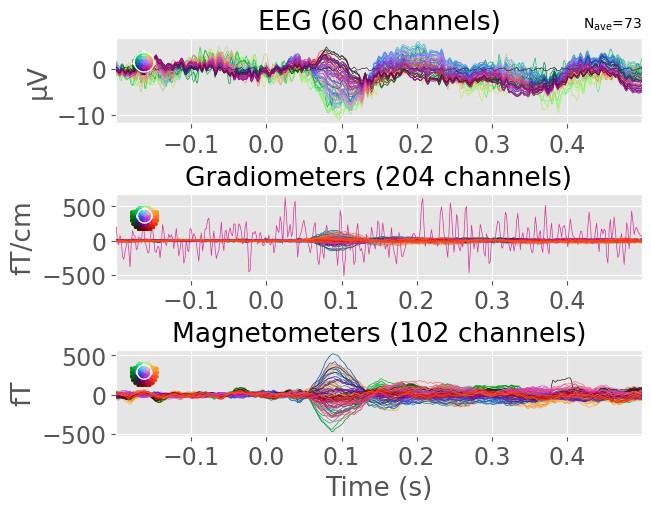

In [403]:
## 假设我们没有坏道信息
raw2 = raw.copy()
raw2.info["bads"] = []
events = mne.find_events(raw2, stim_channel="STI 014")
epochs = mne.Epochs(raw2, events=events)["2"].average().plot()
## 我们能在grad和mag中观察到比较明显的坏道痕迹

### 坏道插值

Removing projector <Projection | PCA-v1, active : False, n_channels : 102>
Removing projector <Projection | PCA-v2, active : False, n_channels : 102>
Removing projector <Projection | PCA-v3, active : False, n_channels : 102>
Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 91.0 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 1 sensors


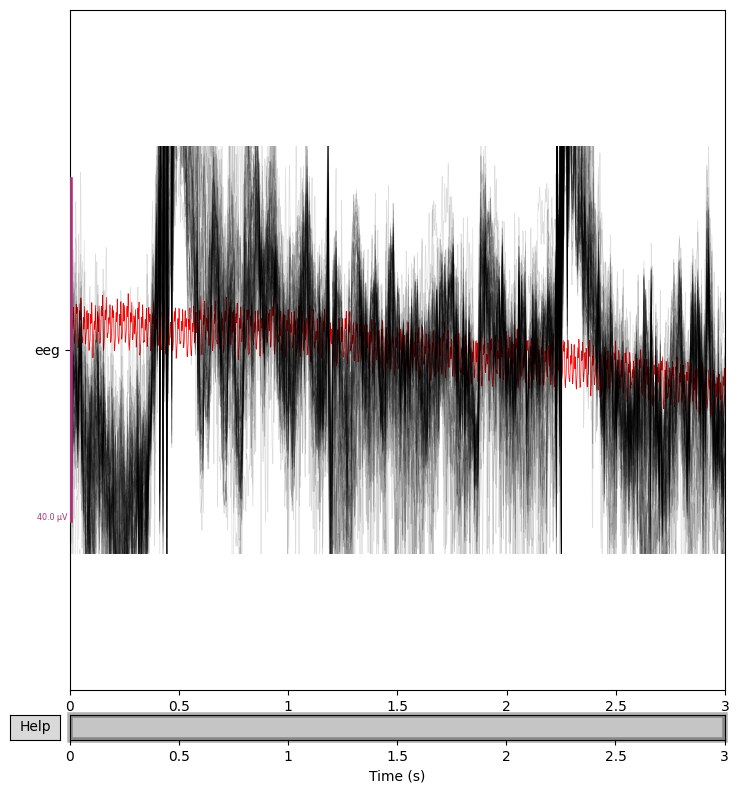

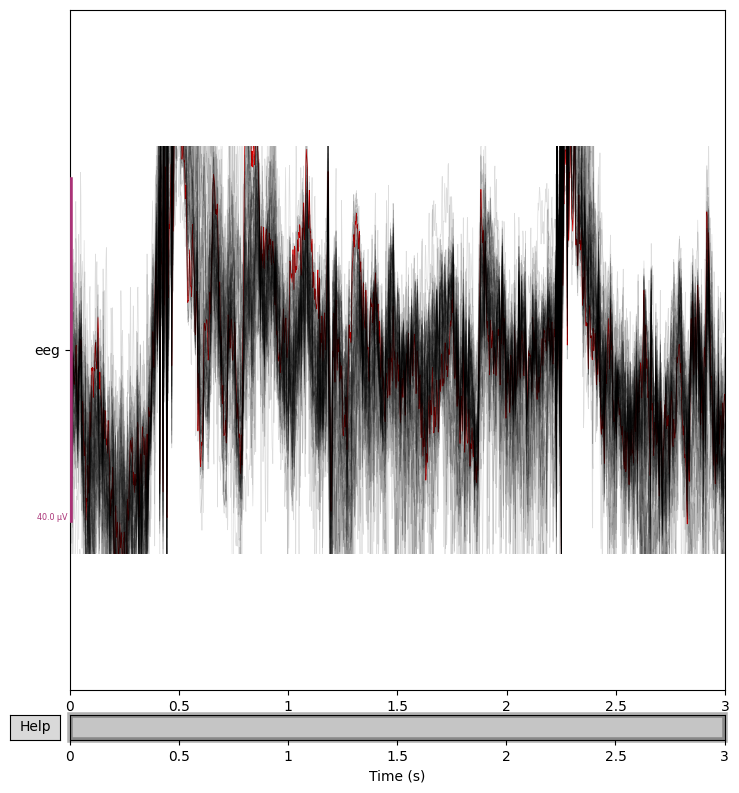

In [341]:
## 截取数据
raw.crop(tmin=0, tmax=3).load_data()
## 取eeg数据
eeg_data = raw.copy().pick(picks="eeg")
## 坏道插值
eeg_data_interp = eeg_data.copy().interpolate_bads(reset_bads=False)
## 对比差异
for title, data in zip(["orig.", "interp."], [eeg_data, eeg_data_interp]):
    with mne.viz.use_browser_backend("matplotlib"):
        fig = data.plot(butterfly=True, color="#00000022", bad_color="r")
    fig.subplots_adjust(top=0.9)
    fig.suptitle(title, size="xx-large", weight="bold")

Removing projector <Projection | PCA-v1, active : False, n_channels : 102>
Removing projector <Projection | PCA-v2, active : False, n_channels : 102>
Removing projector <Projection | PCA-v3, active : False, n_channels : 102>
Setting channel interpolation method to {'meg': 'MNE'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 91.0 mm
    Computing dot products for 203 MEG channels...
    Computing cross products for 203 → 1 MEG channel...
    Preparing the mapping matrix...
    Truncating at 84/203 components to omit less than 0.0001 (9.7e-05)


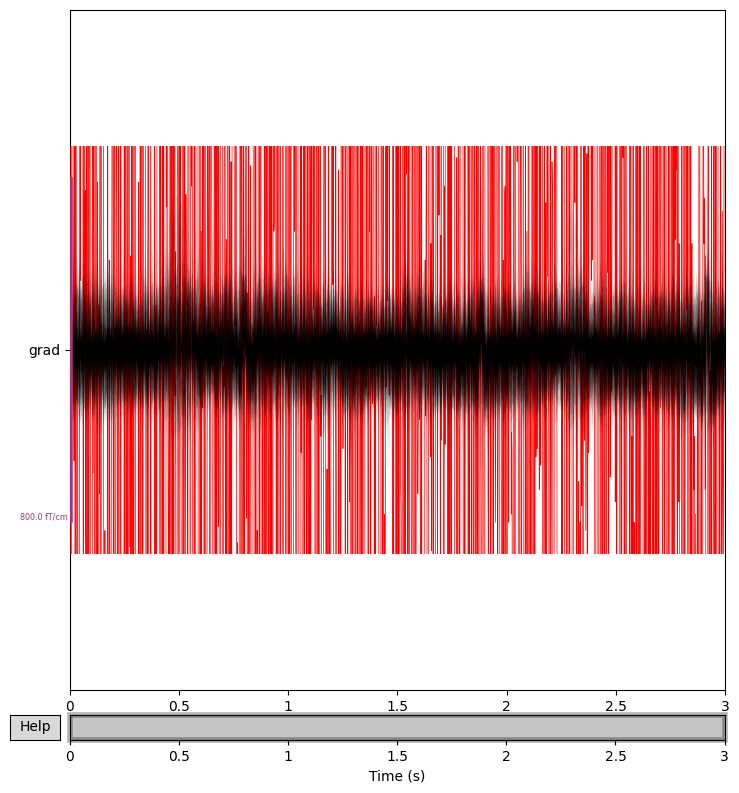

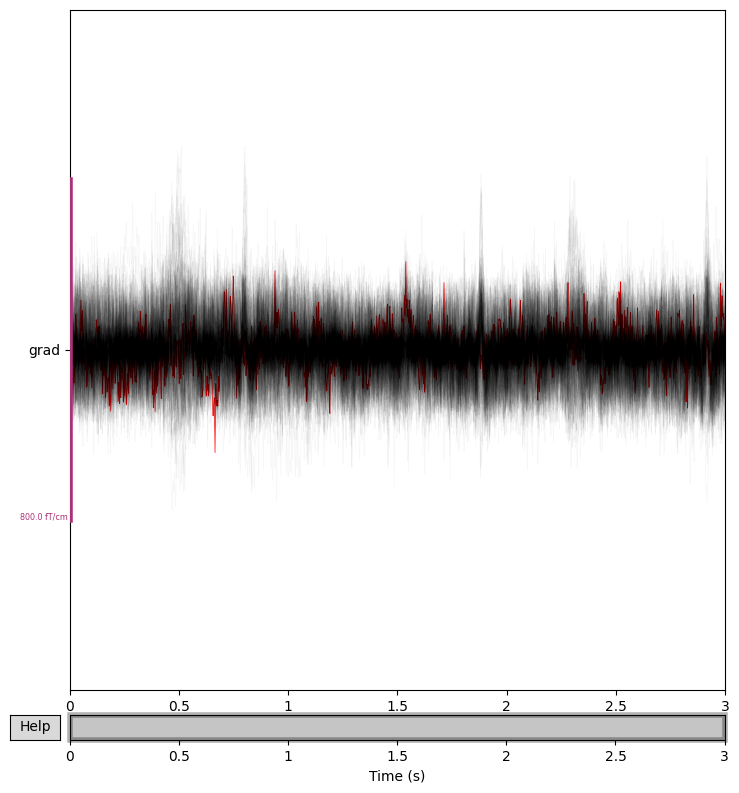

In [342]:
## 取grad数据
grad_data = raw.copy().pick(picks="grad")
grad_data_interp = grad_data.copy().interpolate_bads(reset_bads=False)

for data in (grad_data, grad_data_interp):
    data.plot(butterfly=True, color="#00000009", bad_color="r")

## MNE提供了寻找坏道的函数

---

基于信号空间分离（SSS）和Maxwell滤波器寻找坏道

In [466]:
from mne.preprocessing import find_bad_channels_maxwell

sample_data_folder = mne.datasets.sample.data_path()
sample_data_raw_file = os.path.join(sample_data_folder, "MEG", "sample", "sample_audvis_raw.fif")
raw = mne.io.read_raw_fif(sample_data_raw_file, verbose=False)
raw.crop(tmax=60)
print('数据已包含坏道信息：',raw.info['bads'])
## MEG和EEG有一个坏道
## 清除已有的坏道信息，下面尝试找到它们
raw.info["bads"] = []

数据已包含坏道信息： ['MEG 2443', 'EEG 053']


In [470]:
## 这里试验能否找到MEG的坏道
raw_check = raw.copy()
auto_noisy_chs, auto_flat_chs, auto_scores = find_bad_channels_maxwell(
    raw_check,
    return_scores=True,
    verbose=True,
)
print(auto_noisy_chs)  
print(auto_flat_chs)
## SSS发现了坏道：MEG 2443

Applying low-pass filter with 40.0 Hz cutoff frequency ...
Reading 0 ... 36037  =      0.000 ...    60.000 secs...
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 199 samples (0.331 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s


Scanning for bad channels in 12 intervals (5.0 s) ...
    No bad MEG channels
    Processing 204 gradiometers and 102 magnetometers
    Automatic origin fit: head of radius 91.0 mm
    Using origin -4.1, 16.0, 51.7 mm in the head frame
        Interval   1:    0.000 -    4.998


[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.3s


        Interval   2:    5.000 -    9.998
        Interval   3:   10.000 -   14.998
        Interval   4:   15.000 -   19.998
        Interval   5:   20.000 -   24.998
        Interval   6:   24.999 -   29.998
        Interval   7:   29.999 -   34.997
        Interval   8:   34.999 -   39.997
        Interval   9:   39.999 -   44.997
        Interval  10:   44.999 -   49.997
        Interval  11:   49.999 -   54.997
        Interval  12:   54.999 -   60.000
    Static bad channels:  ['MEG 2443']
    Static flat channels: []
[done]
['MEG 2443']
[]


## 伪迹（Artifact）
----
伪迹是由脑活动之外的来源产生的信号，属于干扰、噪声

伪迹的产生有很多原因
- 环境伪迹：比如电子设备的电磁干扰，开关门的响声
- 设备伪迹：与检测脑信号所用的sensor有关
- 生物伪迹：往往由眨眼、吞咽等运动有关

-----
处理伪迹有三种常用选择
- 忽略伪迹，直接进行后续分析
- 把存在伪迹的数据部分扔出，不进行后续分析
- 通过抑制伪迹信号来修复伪迹

-----
MNE提供了许多修复伪迹的工具：滤波、ICA、SSS和SSP

In [47]:
## 示例数据
sample_data_folder = mne.datasets.sample.data_path()
sample_data_raw_file = os.path.join(sample_data_folder, "MEG", "sample", "sample_audvis_raw.fif")
## 读取示例数据
raw = mne.io.read_raw_fif(sample_data_raw_file)
data, times = raw[:, :]
print('-----------------------------------------')
print('截取前，数据大小：',data.shape)  
## 只截取一部分数据
raw.crop(0, 60).load_data()  
data, times = raw[:, :]
print('-----------------------------------------')
print('截取后，数据大小',data.shape)
print('-----------------------------------------')
print('移除数据中已有的Signal Space Projecion成分')
ssp_projectors = raw.info["projs"]
raw.del_proj()

Opening raw data file /home/dy/mne_data/MNE-sample-data/MEG/sample/sample_audvis_raw.fif...
    Read a total of 3 projection items:
        PCA-v1 (1 x 102)  idle
        PCA-v2 (1 x 102)  idle
        PCA-v3 (1 x 102)  idle
    Range : 25800 ... 192599 =     42.956 ...   320.670 secs
Ready.
-----------------------------------------
截取前，数据大小： (376, 166800)
Reading 0 ... 36037  =      0.000 ...    60.000 secs...
-----------------------------------------
截取后，数据大小 (376, 36038)
-----------------------------------------
移除数据中已有的Signal Space Projecion成分


Measurement date,"December 03, 2002 19:01:10 GMT"
Experimenter,MEG
Participant,Unknown
Digitized points,146 points
Good channels,"203 Gradiometers, 102 Magnetometers, 9 Stimulus, 59 EEG, 1 EOG"
Bad channels,"MEG 2443, EEG 053"
EOG channels,EOG 061
ECG channels,Not available
Sampling frequency,600.61 Hz
Highpass,0.10 Hz
Lowpass,172.18 Hz


## 检测伪迹，Detection
-----

- 低频漂移：用高通滤波器滤除，截止频率一般选择0.1Hz
- 电源线噪声：查看功率谱，在电源线基频和谐波上有窄峰
- 心跳伪迹：由心电引起（ECG），在功率谱上25Hz位置有窄峰
- 眼球伪迹：眨眼、转动眼球引起，在EEG中非常显著

### 低频漂移

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19821 samples (33.001 s)



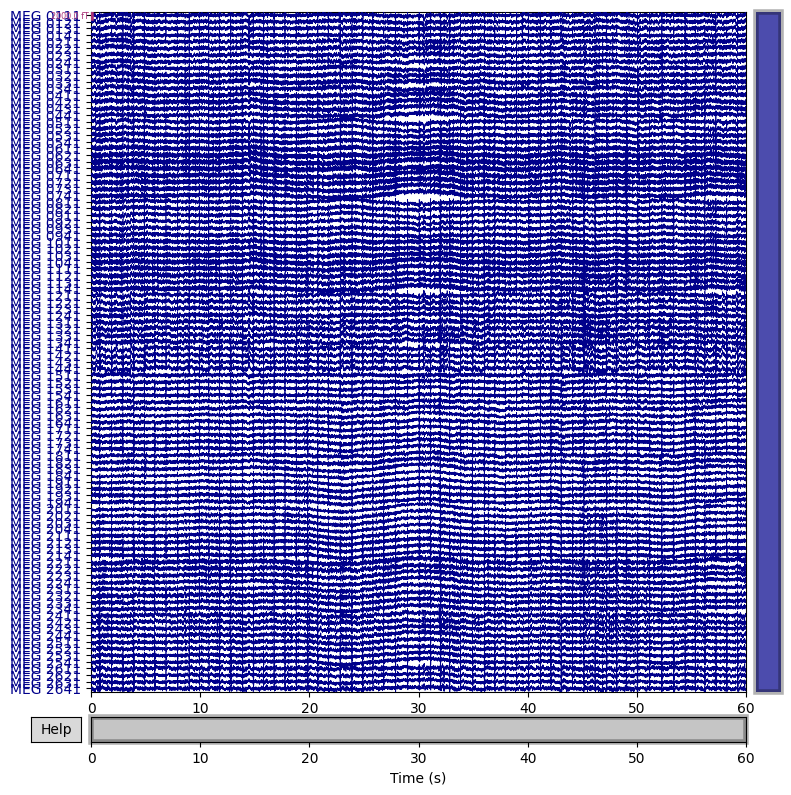

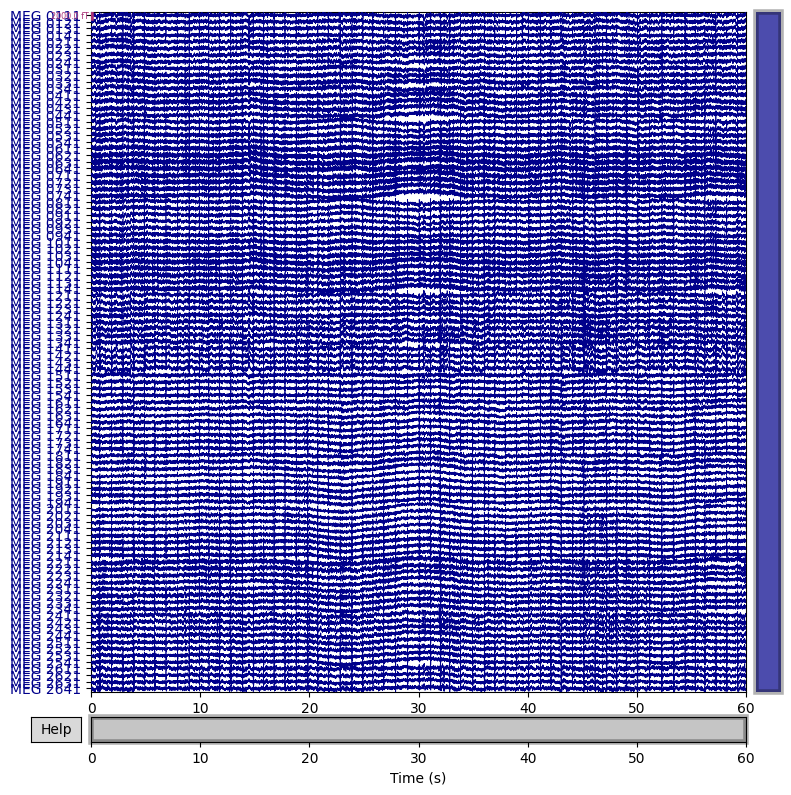

In [50]:
# 低频漂移
## 高通0.1Hz滤波,滤波器类型和窗函数可调整
raw.filter(l_freq=0.1, h_freq=None, method='fir', fir_window='hamming')

## 查看数据，只查看前60s
## 选择102个 Magnetometers（'mag'）通道
mag_channels = mne.pick_types(raw.info, meg="mag")
raw.plot(duration=60, order=mag_channels, n_channels=len(mag_channels), remove_dc=False)

#### 电源线噪声

Effective window size : 3.410 (s)
包含EEG、Gradiometers、Magnetometers三种通道的功率谱


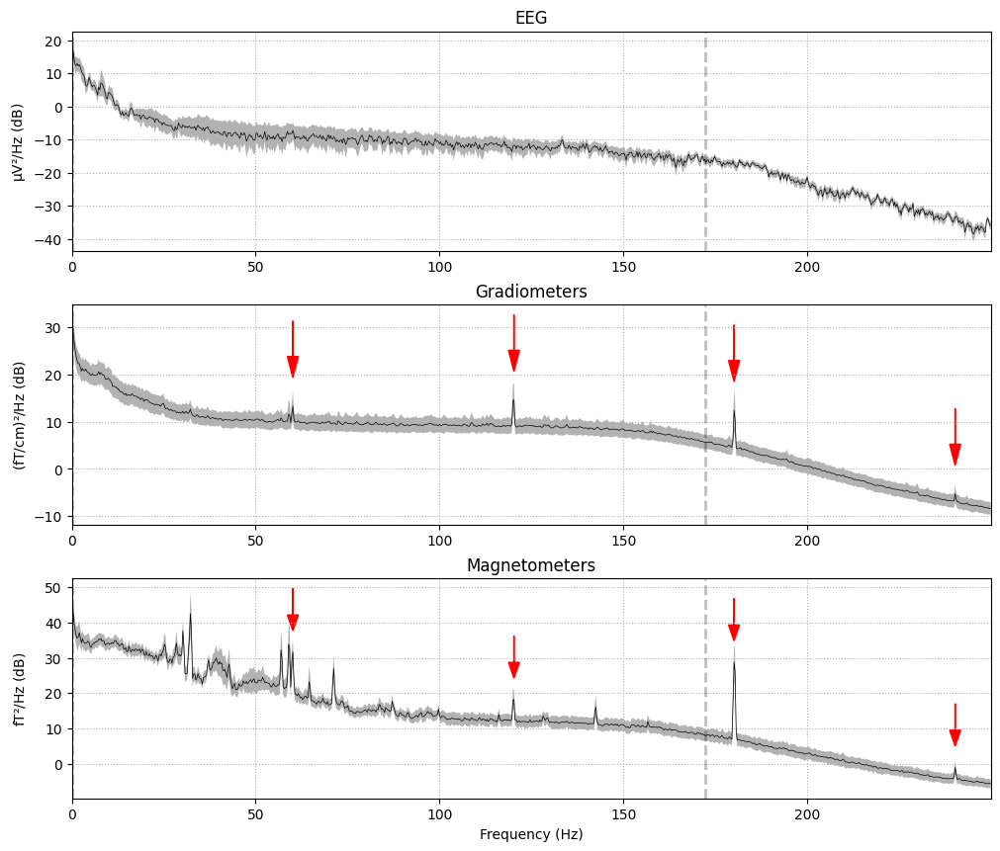

In [84]:
# 电源线噪声
## 计算功率谱
fig = raw.compute_psd(tmax=np.inf, fmax=250).plot(average=True, amplitude=False, picks="data", exclude="bads")
print('包含EEG、Gradiometers、Magnetometers三种通道的功率谱')

## 红色箭头指示了的能量窄峰由电源线引起
## 之所以是60Hz,120Hz,180Hz和240Hz，是因为这些是美国电源线的基频和谐波
## 我们国家是50Hz的基频，谐波是100Hz，150Hz，200Hz
## 根据数据的具体情况查看

## 在Mag通道的25Hz左右观察到的窄峰是由心跳引起的伪迹

for ax in fig.axes[1:]:
    freqs = ax.lines[-1].get_xdata()
    psds = ax.lines[-1].get_ydata()
    for freq in (60, 120, 180, 240):
        idx = np.searchsorted(freqs, freq)
        ax.arrow(
            x=freqs[idx],
            y=psds[idx] + 18,
            dx=0,
            dy=-12,
            color="red",
            width=0.1,
            head_width=3,
            length_includes_head=True,
        )
plt.show()

### ECG干扰

Reconstructing ECG signal from Magnetometers
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 6007 samples (10.001 s)

Number of ECG events detected : 59 (average pulse 58 / min.)
Not setting metadata
59 matching events found
No baseline correction applied
Using data from preloaded Raw for 59 events and 601 original time points ...
0 bad epochs dropped
Not setting metadata
59 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
59 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
5

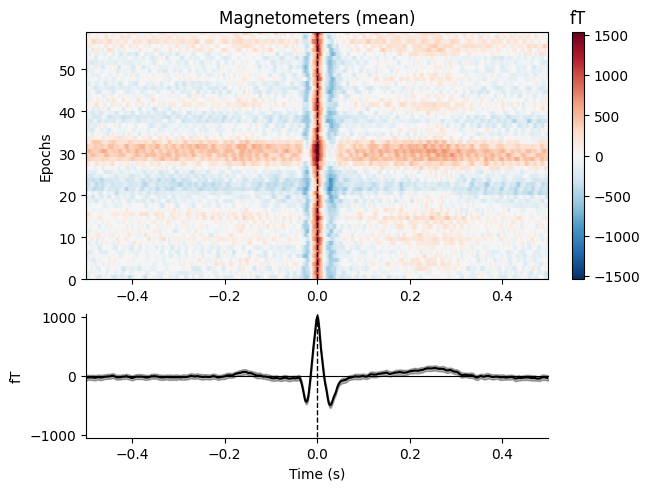

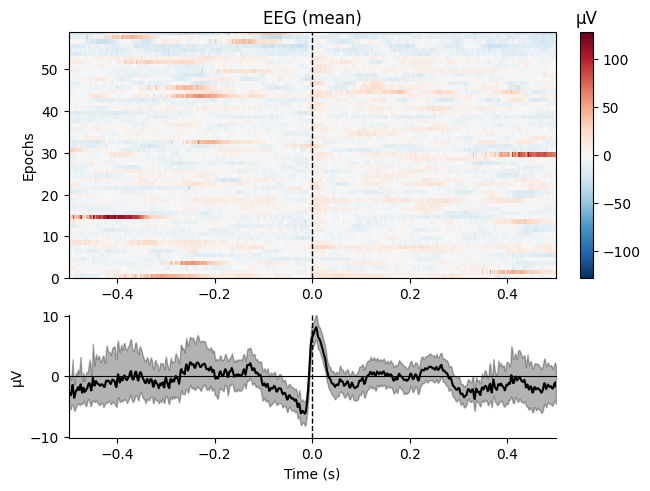

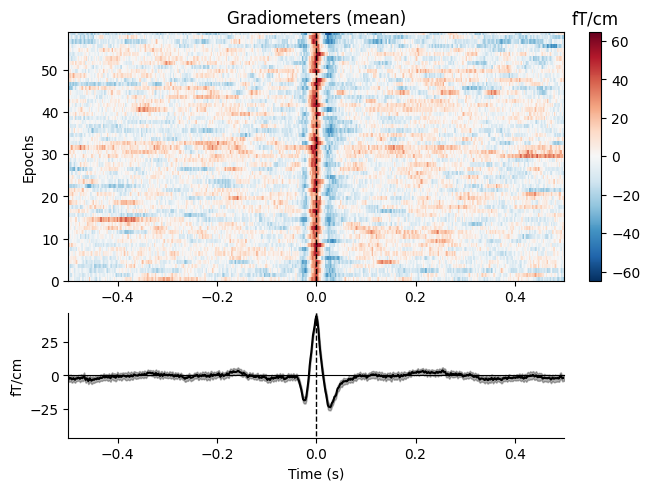

---------------------------------------
Applying baseline correction (mode: mean)


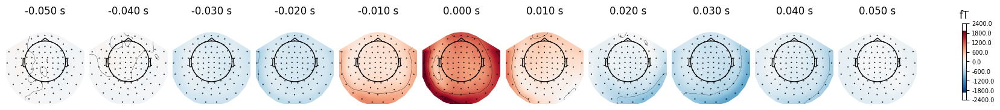

No projector specified for this dataset. Please consider the method self.add_proj.


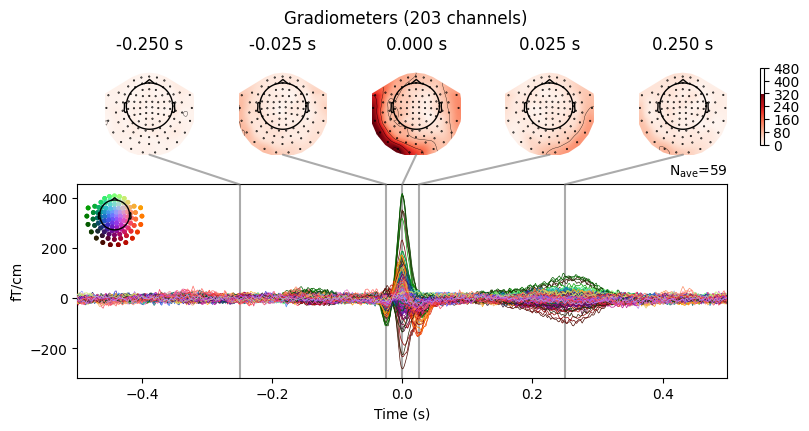

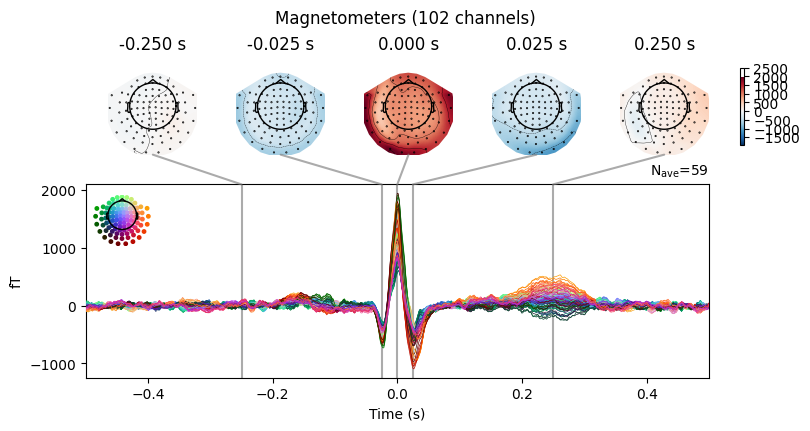

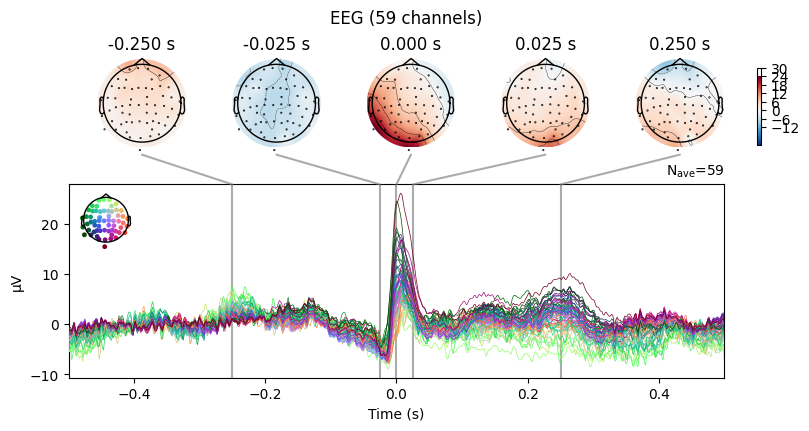

[<Figure size 800x420 with 8 Axes>,
 <Figure size 800x420 with 8 Axes>,
 <Figure size 800x420 with 8 Axes>]

In [105]:
## 提取心跳伪迹（ECG）信号
## 自动检测ECG信号，每个时期（epoch）对应一个ECG事件（如一次心跳）
## 检测R波峰值（心跳）的时间点，然后以每个R波峰值为中心，提取一段固定时间长度的数据
## 显示的是所有通道的均值
## 热量图中的垂直线表明存在心跳伪迹
ecg_epochs = mne.preprocessing.create_ecg_epochs(raw)
ecg_epochs.plot_image(combine="mean")

print('---------------------------------------')

## 或者用基线校正查看
## 计算心跳前0.5~0.2秒的平均值并减去
avg_ecg_epochs = ecg_epochs.average().apply_baseline((-0.5, -0.2))

avg_ecg_epochs.plot_topomap(times=np.linspace(-0.05, 0.05, 11))

avg_ecg_epochs.plot_joint(times=[-0.25, -0.025, 0, 0.025, 0.25])

### EOG干扰

Using EOG channel: EOG 061
EOG channel index for this subject is: [375]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel EOG 061 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 6007 samples (10.001 s)

Now detecting blinks and generating corresponding events
Found 10 significant peaks
Number of EOG events detected: 10
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
Using data from preloaded Raw for 10 events and 601 original time points ...
0 bad epochs dropped
Not setting m

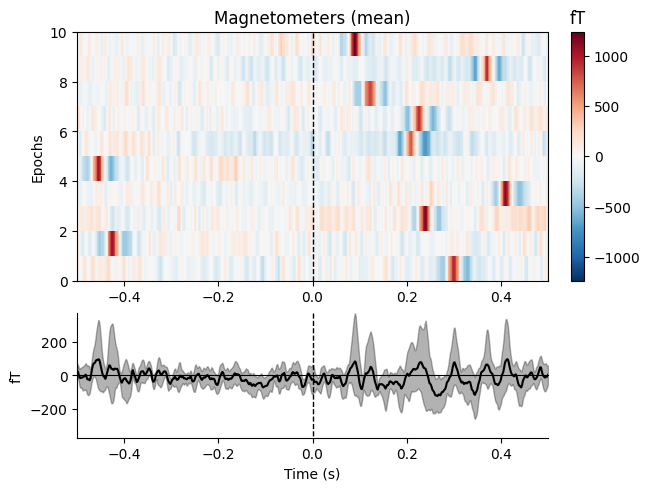

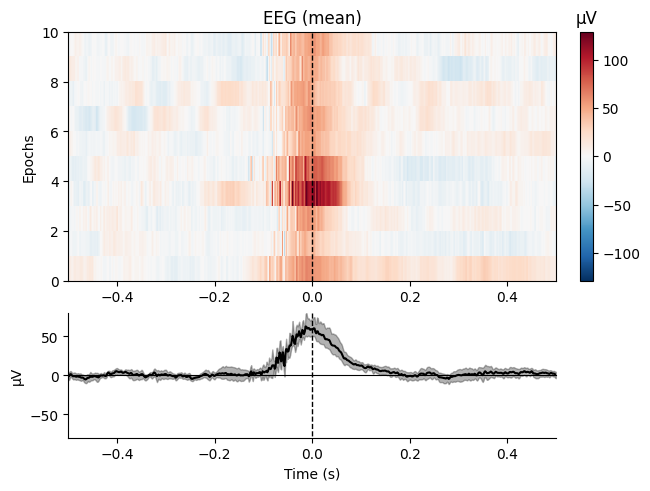

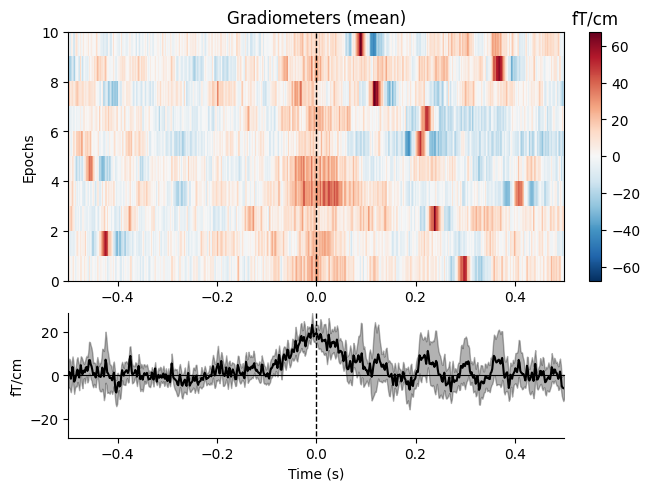

No projector specified for this dataset. Please consider the method self.add_proj.


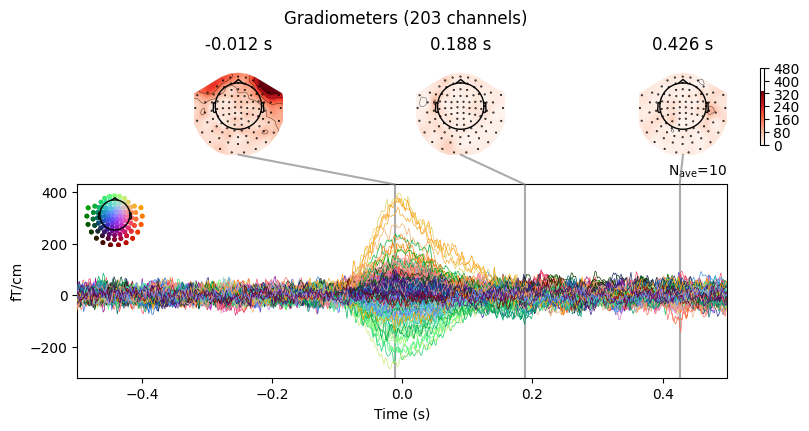

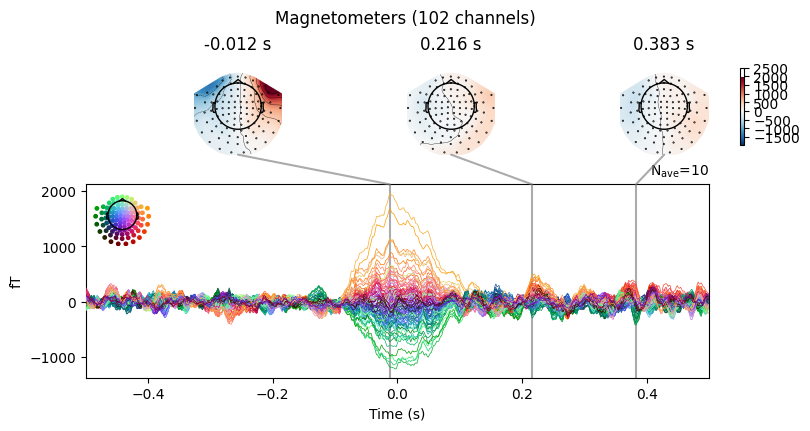

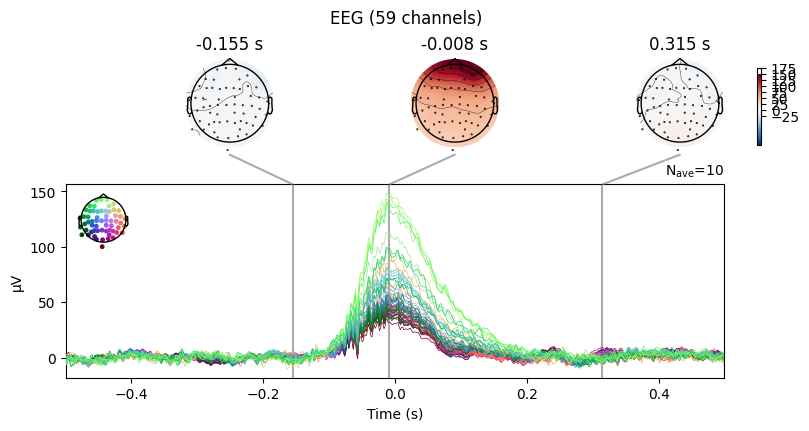

[<Figure size 800x420 with 6 Axes>,
 <Figure size 800x420 with 6 Axes>,
 <Figure size 800x420 with 6 Axes>]

In [106]:
## 检测眼球伪迹
eog_epochs = mne.preprocessing.create_eog_epochs(raw, baseline=(-0.5, -0.2))
eog_epochs.plot_image(combine="mean")
eog_epochs.average().plot_joint()

## 修复伪迹，Repair
-----

在Repair之前需要先查看有没有伪迹，选择正确的工具

如果伪迹够轻微，可以不修复

- 滤波：低频偏移、电源线噪声
- SSP：环境噪声、ECG、EOG

In [350]:
## 选择示例数据的man、stim通道前60s的数据

raw = mne.io.read_raw_fif(sample_data_raw_file)
# use just 60 seconds of data and mag channels, to save memory
raw.crop(0, 60).pick(picks=["mag", "stim"]).load_data()

Opening raw data file /home/dy/mne_data/MNE-sample-data/MEG/sample/sample_audvis_raw.fif...
    Read a total of 3 projection items:
        PCA-v1 (1 x 102)  idle
        PCA-v2 (1 x 102)  idle
        PCA-v3 (1 x 102)  idle
    Range : 25800 ... 192599 =     42.956 ...   320.670 secs
Ready.
Reading 0 ... 36037  =      0.000 ...    60.000 secs...


Measurement date,"December 03, 2002 19:01:10 GMT"
Experimenter,MEG
Participant,Unknown
Digitized points,146 points
Good channels,"102 Magnetometers, 9 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,600.61 Hz
Highpass,0.10 Hz
Lowpass,172.18 Hz


### 滤波方法

-------------------------------------
		滤波前
-------------------------------------


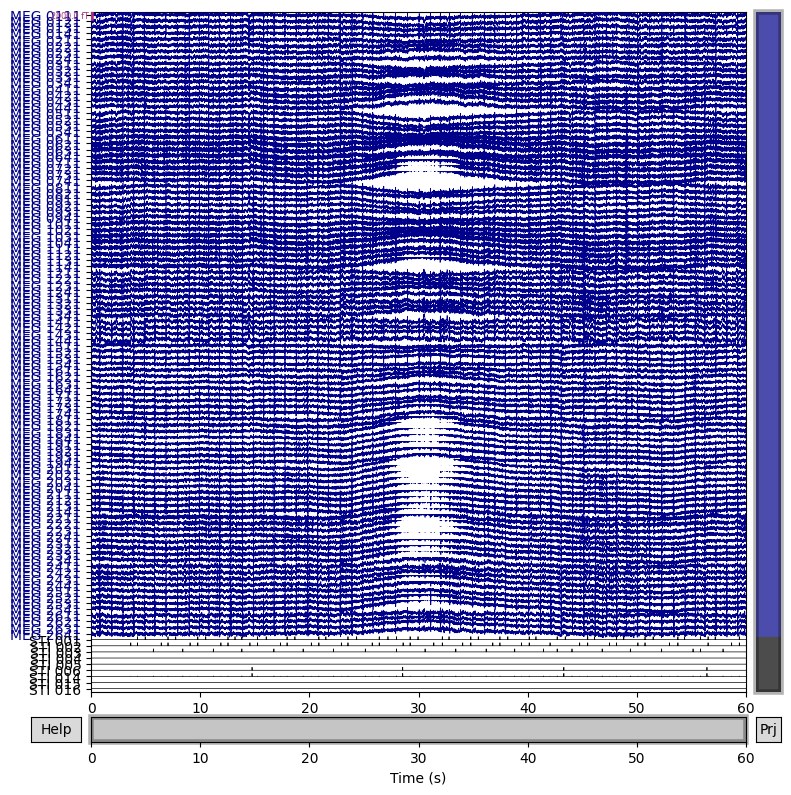

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19821 samples (33.001 s)

-------------------------------------
	0.1Hz 高通滤波结果
-------------------------------------


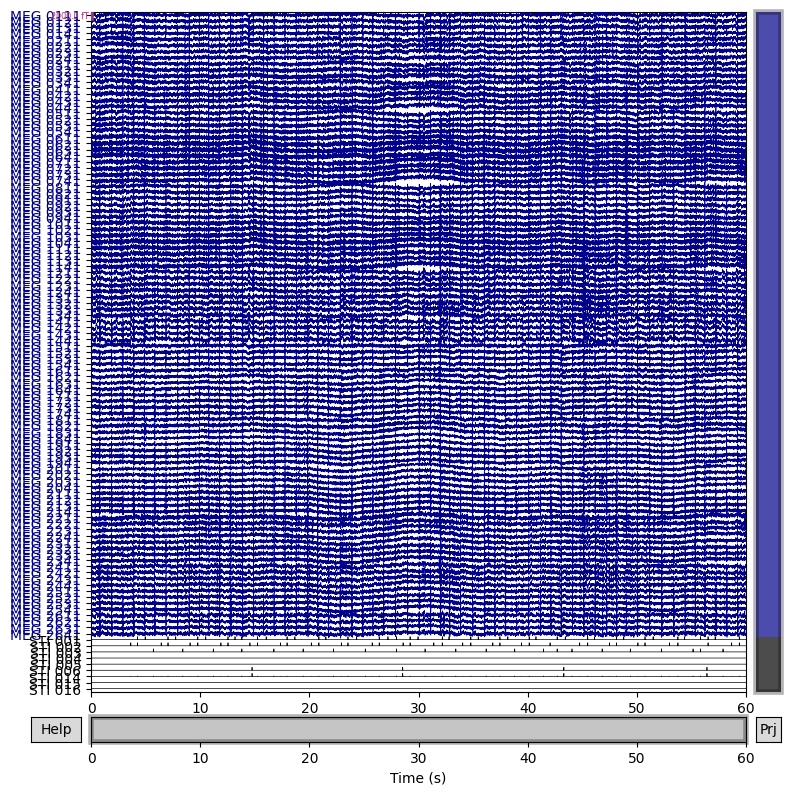

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.20
- Lower transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.10 Hz)
- Filter length: 9911 samples (16.501 s)

-------------------------------------
	0.2Hz 高通滤波结果
-------------------------------------


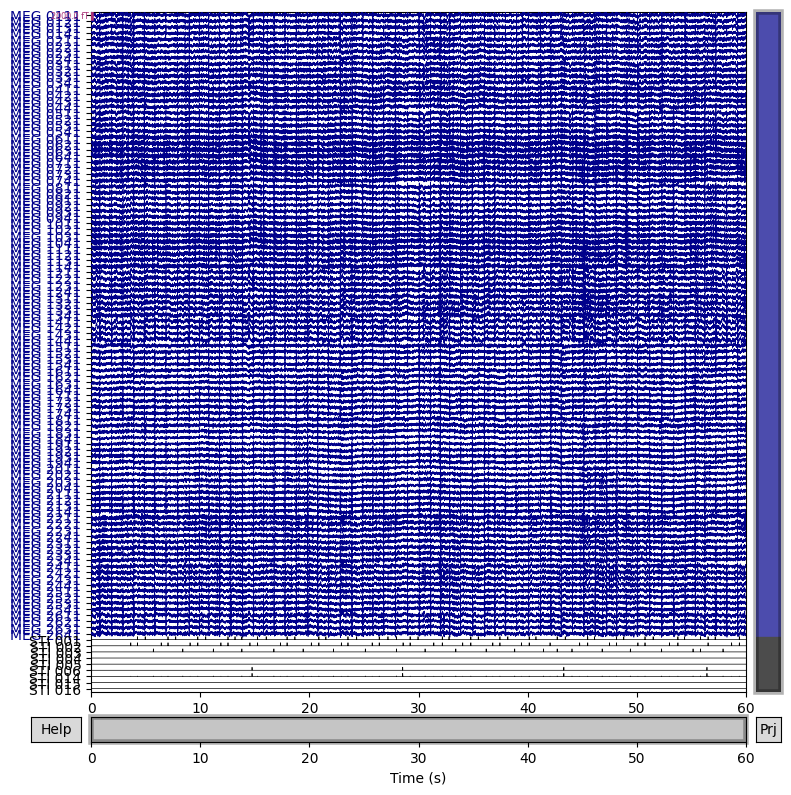

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.20
- Lower transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.10 Hz)
- Filter length: 9911 samples (16.501 s)



In [351]:
## 滤波方法消除低频偏移
## 滤波前的数据
print('-------------------------------------')
print('\t\t滤波前')
print('-------------------------------------')
raw.plot(duration=60, proj=False, n_channels=len(raw.ch_names), remove_dc=False)


## 查看0.1Hz和0.2Hz截止频率滤波效果
for cutoff in (0.1, 0.2):
    raw_highpass = raw.copy().filter(l_freq=cutoff, h_freq=None)
    
    print('-------------------------------------')
    print('\t' + str(cutoff)+'Hz 高通滤波结果')
    print('-------------------------------------')

    with mne.viz.use_browser_backend("matplotlib"):
        fig = raw_highpass.plot(duration=60, proj=False, n_channels=len(raw.ch_names), remove_dc=False)
    fig.subplots_adjust(top=0.9)    
## 结果发现0.1Hz还不够高，0.2Hz比较合适
## 选择0.2Hz滤波消除低频漂移
raw_highpass = raw.copy().filter(l_freq=0.2, h_freq=None)

-------------------------------------
		滤波前
-------------------------------------
Effective window size : 3.410 (s)


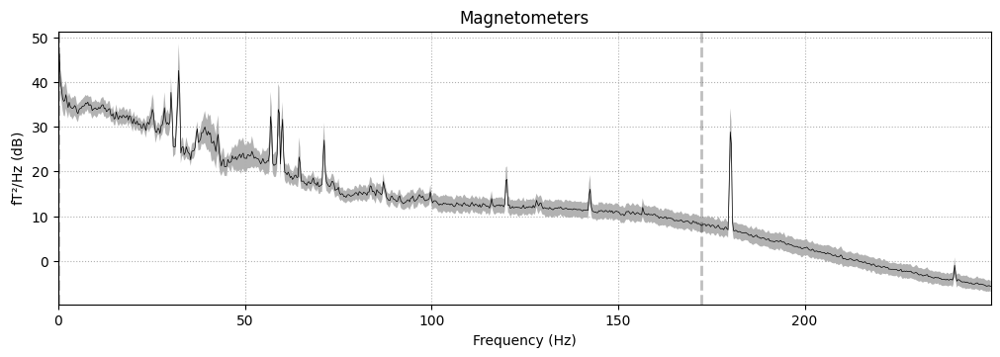

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3965 samples (6.602 s)

-------------------------------------
		滤波后
-------------------------------------
Effective window size : 3.410 (s)


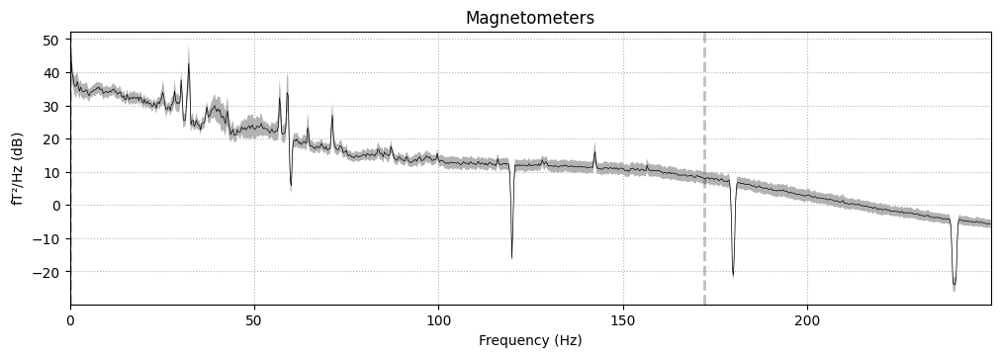

In [352]:
## 计算功率谱，观察到电源线噪声
print('-------------------------------------')
print('\t\t滤波前')
print('-------------------------------------')
fig = raw.compute_psd(tmax=np.inf, fmax=250).plot(average=True, amplitude=False, picks="data", exclude="bads")
plt.show(fig.axes[0])## 选择MEG通道
meg_picks = mne.pick_types(raw.info, meg=True)
freqs = (60, 120, 180, 240)
## 陷波（notch）滤波
raw_notch = raw.copy().notch_filter(freqs=freqs, picks=meg_picks)
print('-------------------------------------')
print('\t\t滤波后')
print('-------------------------------------')
fig = raw_notch.compute_psd(tmax=np.inf, fmax=250).plot(average=True, amplitude=False, picks="data", exclude="bads")
plt.show(fig.axes[0])

### SSP消除ECG影响

In [300]:
## SSP将信号以线性组合的方式投影到低维空间，以便分离有用信号和噪声

## 示例数据
sample_data_folder = mne.datasets.sample.data_path()
sample_data_raw_file = os.path.join(sample_data_folder, "MEG", "sample", "sample_audvis_raw.fif")
raw = mne.io.read_raw_fif(sample_data_raw_file).crop(0, 60)

data, times = raw[:, :]
print('---------------------------------------')
print('数据重采样前，数据大小',data.shape)
print('---------------------------------------')

raw.load_data().resample(100) # 重采样
data, times = raw[:, :]
print('---------------------------------------')
print('数据重采样后，数据大小',data.shape)
print('---------------------------------------')

## 数据在采集的时候进行过SSP修复伪迹，给它丢掉
system_projs = raw.info["projs"]
raw.del_proj()

Opening raw data file /home/dy/mne_data/MNE-sample-data/MEG/sample/sample_audvis_raw.fif...
    Read a total of 3 projection items:
        PCA-v1 (1 x 102)  idle
        PCA-v2 (1 x 102)  idle
        PCA-v3 (1 x 102)  idle
    Range : 25800 ... 192599 =     42.956 ...   320.670 secs
Ready.
---------------------------------------
数据重采样前，数据大小 (376, 36038)
---------------------------------------
Reading 0 ... 36037  =      0.000 ...    60.000 secs...
86 events found on stim channel STI 014
Event IDs: [ 1  2  3  4  5 32]
86 events found on stim channel STI 014
Event IDs: [ 1  2  3  4  5 32]
---------------------------------------
数据重采样后，数据大小 (376, 6000)
---------------------------------------


Measurement date,"December 03, 2002 19:01:10 GMT"
Experimenter,MEG
Participant,Unknown
Digitized points,146 points
Good channels,"203 Gradiometers, 102 Magnetometers, 9 Stimulus, 59 EEG, 1 EOG"
Bad channels,"MEG 2443, EEG 053"
EOG channels,EOG 061
ECG channels,Not available
Sampling frequency,100.00 Hz
Highpass,0.10 Hz
Lowpass,50.00 Hz


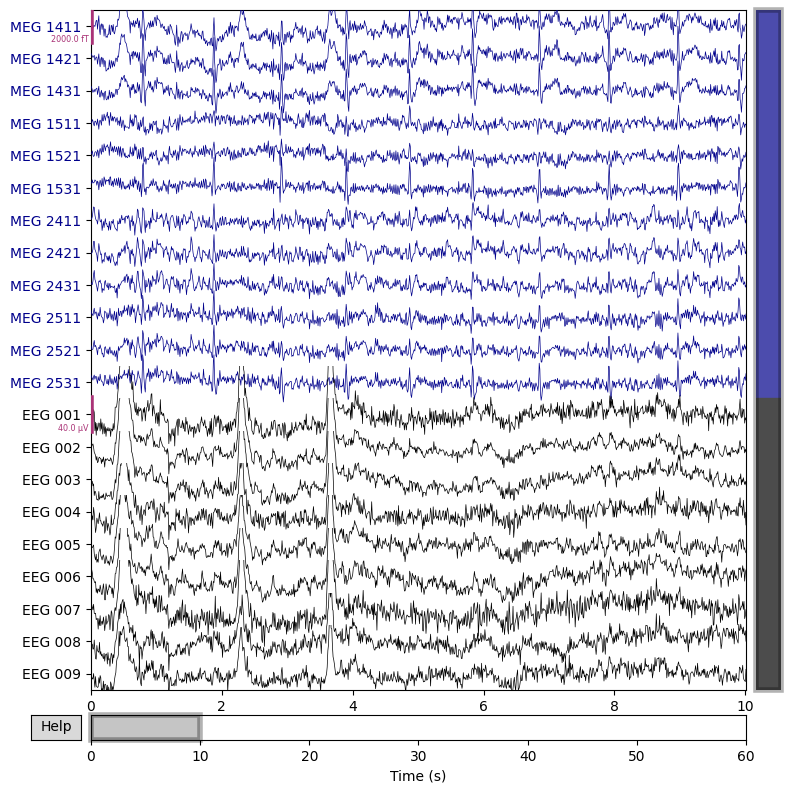

Applying baseline correction (mode: mean)
No projector specified for this dataset. Please consider the method self.add_proj.


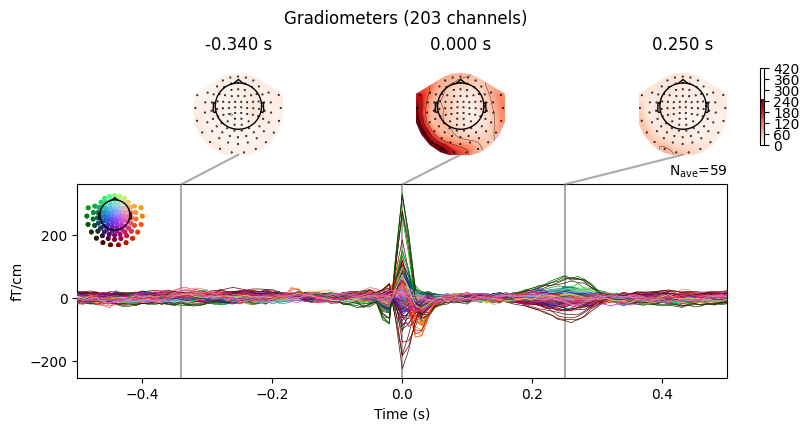

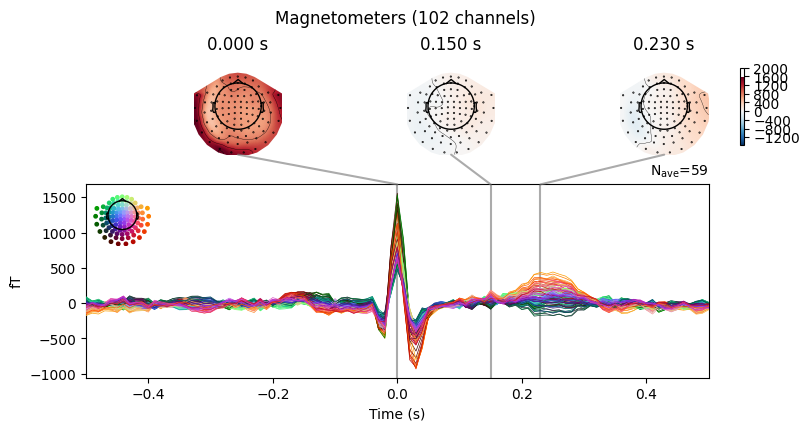

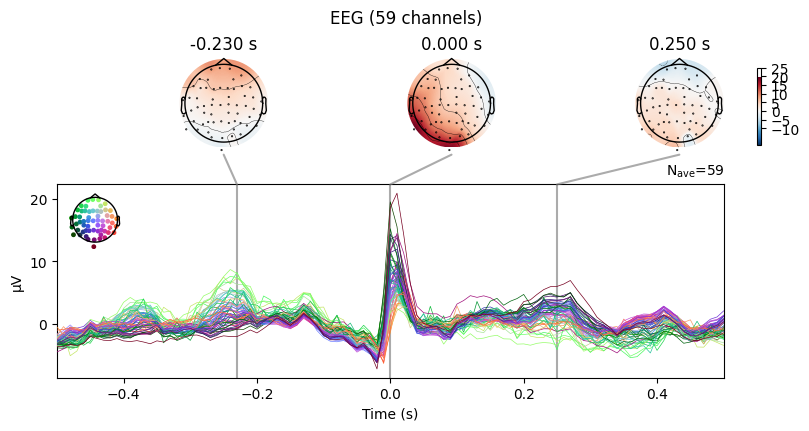

[<Figure size 800x420 with 6 Axes>,
 <Figure size 800x420 with 6 Axes>,
 <Figure size 800x420 with 6 Axes>]

In [301]:
## 在修复伪影之前先查看数据

# 选择包含ECG和EOG干扰的通道
regexp = r"(MEG [12][45][123]1|EEG 00.)"
artifact_picks = mne.pick_channels_regexp(raw.ch_names, regexp=regexp)
raw.plot(order=artifact_picks, n_channels=len(artifact_picks))
plt.show()

# 用Detection提到的方法观察ECG和EOG伪影
ecg_evoked.apply_baseline((None, None)) # 基线平均，避免因比例问题误认为没有伪影
ecg_evoked.plot_joint()
# 发现存在ECG和EOG伪影

Including 0 SSP projectors from raw file
Running ECG SSP computation
Reconstructing ECG signal from Magnetometers
Setting up band-pass filter from 5 - 35 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 5.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 4.75 Hz)
- Upper passband edge: 35.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 35.25 Hz)
- Filter length: 1000 samples (10.000 s)

Number of ECG events detected : 58 (average pulse 58 / min.)
Computing projector
Filtering a subset of channels. The highpass and lowpass values in the measurement info will not be updated.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 35 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter

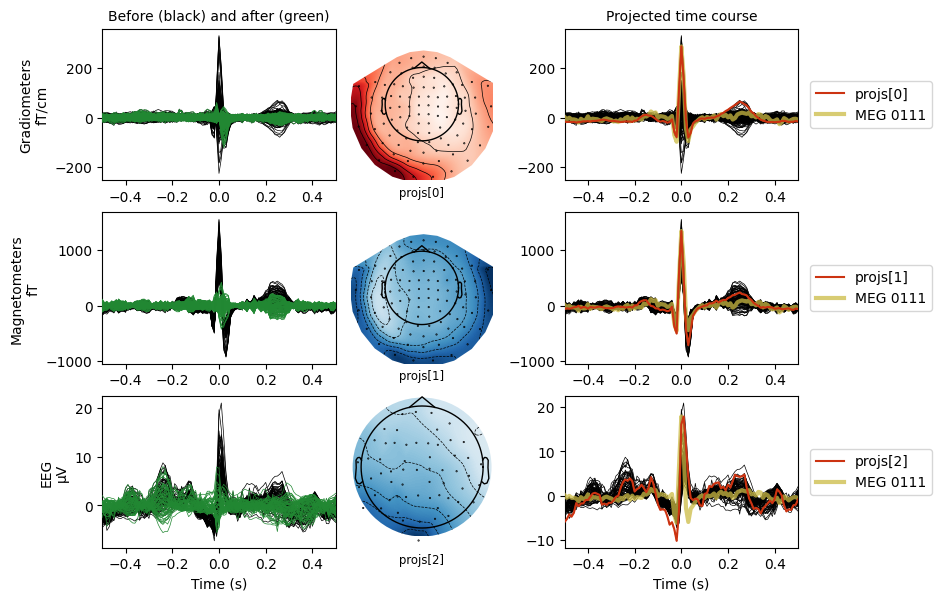

In [302]:
## SSP消除ECG伪影，grad,mag和eeg都只选择一个投影
projs, events = compute_proj_ecg(raw, n_grad=1, n_mag=1, n_eeg=1, reject=None)
## ‘Including 0 SSP projectors from raw file’说明数据不包括SSP投影，如果之前有，结果会在原来的基础上追加
## 我们可以查看projs中有哪些投影
ecg_projs = projs
print('------------------------------')
for pj in ecg_projs:print(pj)
print('------------------------------')


# 查看空间分布
fig = mne.viz.plot_projs_joint(ecg_projs, ecg_evoked, picks_trace="MEG 0111")
fig.suptitle("ECG projectors")
plt.show()

# 左列的图是ECG干扰，原来的ECG（黑色）干扰被抑制了（绿色）
# 中间一列的图是投影的空间模式，三者各一个投影
# 右列的图也是ECG干扰，但展示了ECG是如何被抑制的：投影有用信号，减少ECG的干扰

# 实际上compute_proj_ecg函数中含有滤波器，可以可以调节参数

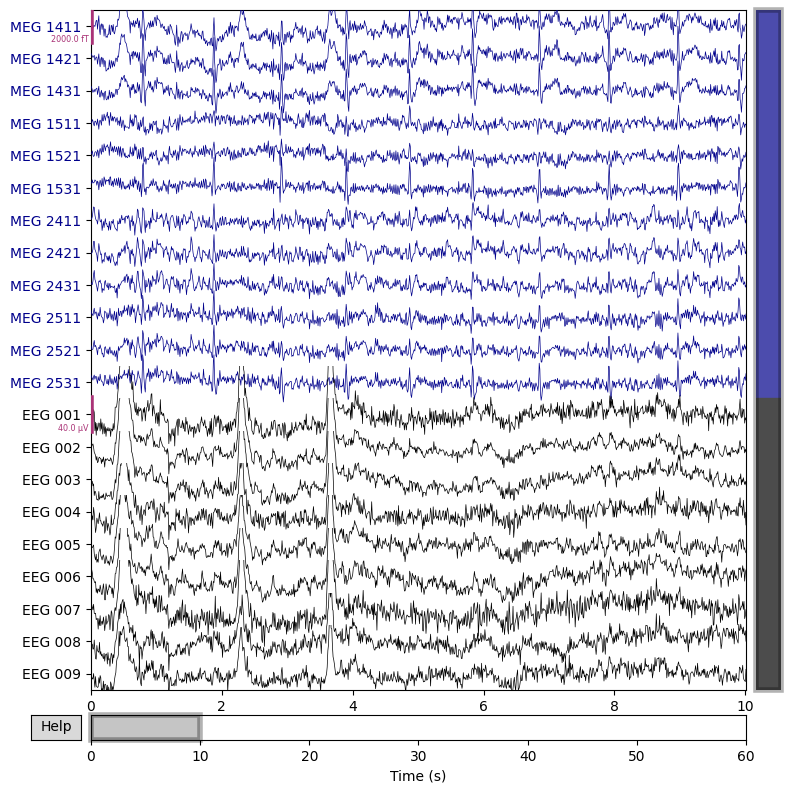

3 projection items deactivated


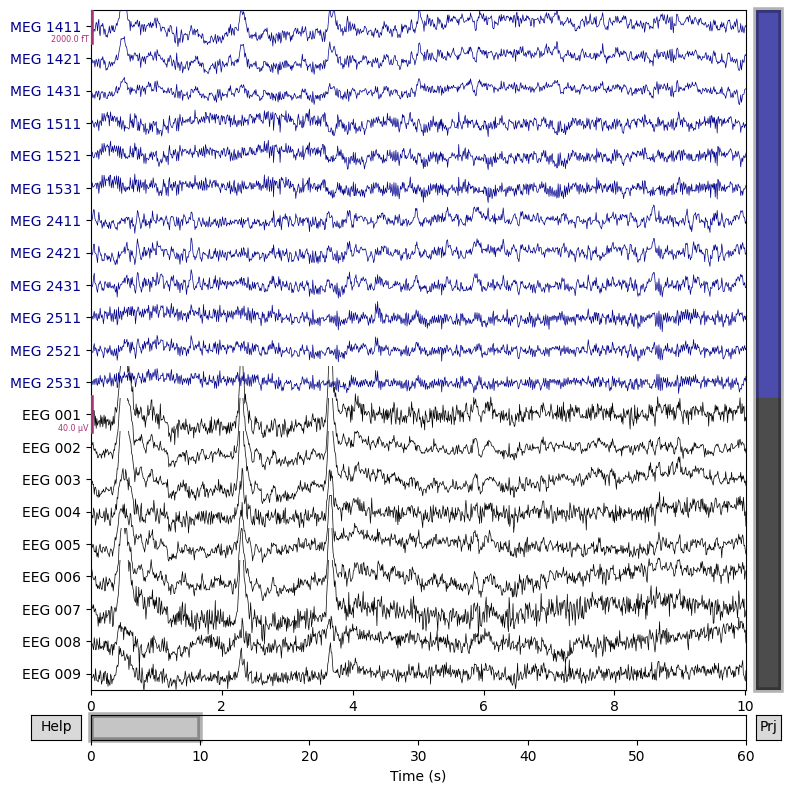

In [306]:
# 确定数据没有SSP矫正过
raw.del_proj()
# 没有添加投影消除ECG的数据
raw.plot(order=artifact_picks, n_channels=len(artifact_picks))
# 添加SSP投影
raw.add_proj(proj, remove_existing=False)
# 添加投影后ECG影响被消除了
fig = raw.plot(order=artifact_picks, n_channels=len(artifact_picks))

### SSP消除EOG影响

Using EOG channel: EOG 061
EOG channel index for this subject is: [375]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel EOG 061 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1000 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 10 significant peaks
Number of EOG events detected: 10
Not setting metadata
10 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 3)
Using data from preloaded Raw for 10 events and 101 original time points 

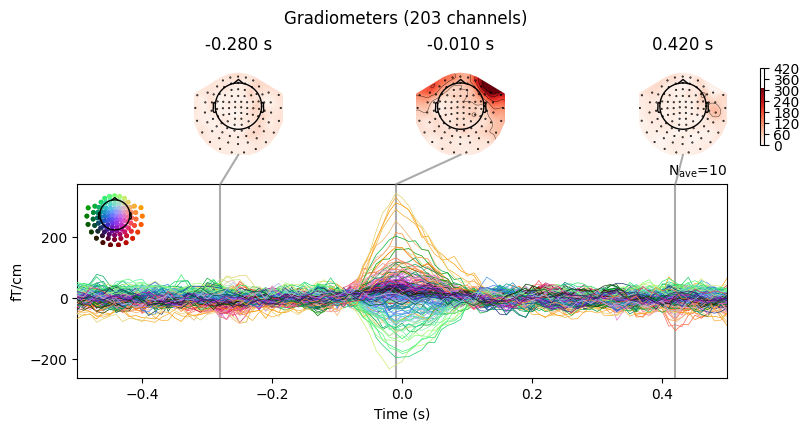

Removing projector <Projection | ECG-planar--0.200-0.400-PCA-01, active : True, n_channels : 203, exp. var : 74.55%>
Removing projector <Projection | ECG-eeg--0.200-0.400-PCA-01, active : True, n_channels : 59, exp. var : 77.45%>


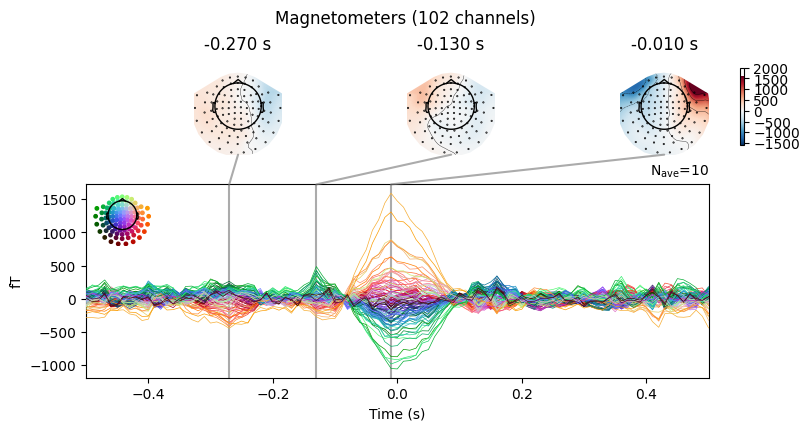

Removing projector <Projection | ECG-planar--0.200-0.400-PCA-01, active : True, n_channels : 203, exp. var : 74.55%>
Removing projector <Projection | ECG-axial--0.200-0.400-PCA-01, active : True, n_channels : 102, exp. var : 88.06%>


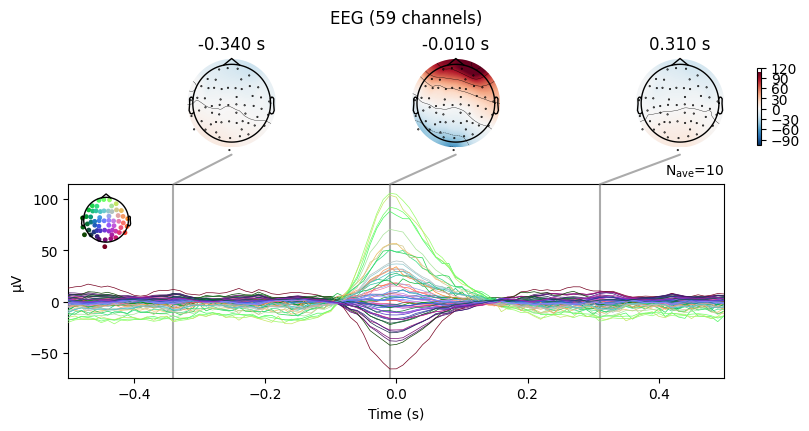

[<Figure size 800x420 with 6 Axes>,
 <Figure size 800x420 with 6 Axes>,
 <Figure size 800x420 with 6 Axes>]

In [310]:
## 先查看有没有EOG干扰
eog_evoked = create_eog_epochs(raw).average(picks="all")
eog_evoked.apply_baseline((None, None))
eog_evoked.plot_joint()
## 发现明显的EOG干扰

Running EOG SSP computation
Using EOG channel: EOG 061
EOG channel index for this subject is: [375]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel EOG 061 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1000 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 10 significant peaks
Number of EOG events detected: 10
Computing projector
Filtering a subset of channels. The highpass and lowpass values in the measurement info will not be updated.
Filtering raw data in 1 contiguous segment

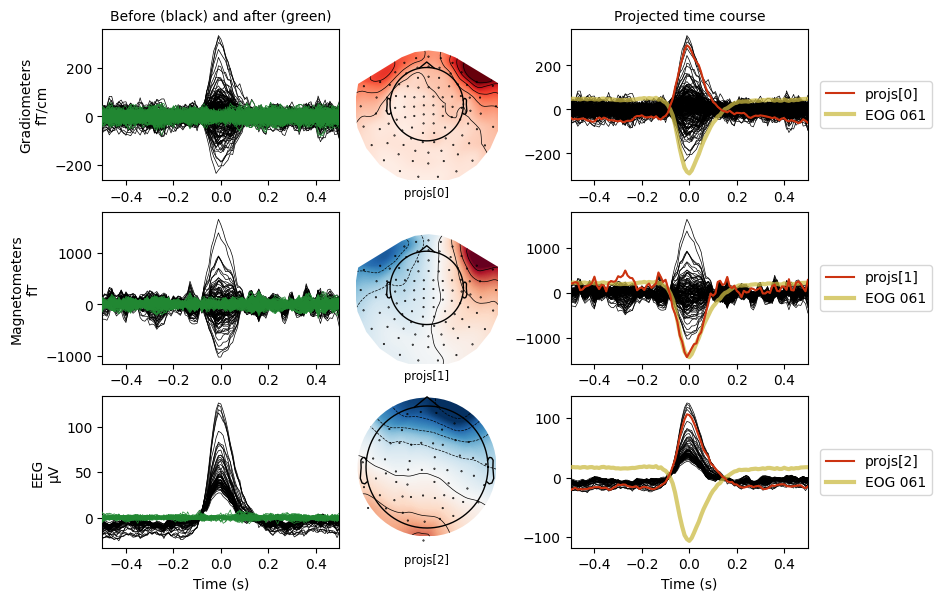

Text(0.5, 0.98, 'EOG projectors')

In [315]:
# 计算SSP投影，各一个投影
eog_projs, _ = compute_proj_eog(raw, n_grad=1, n_mag=1, n_eeg=1, reject=None, no_proj=True)
# 查看投影的空间模式
fig = mne.viz.plot_projs_joint(eog_projs, eog_evoked, "eog")
fig.suptitle("EOG projectors")
# SSP投影很好的消除了EOG影响

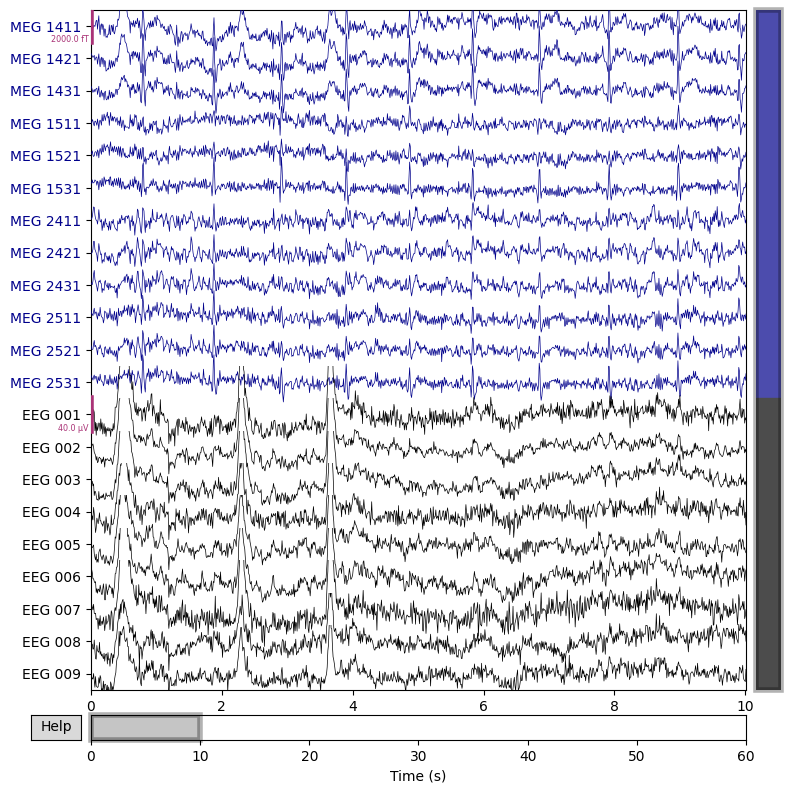

3 projection items deactivated


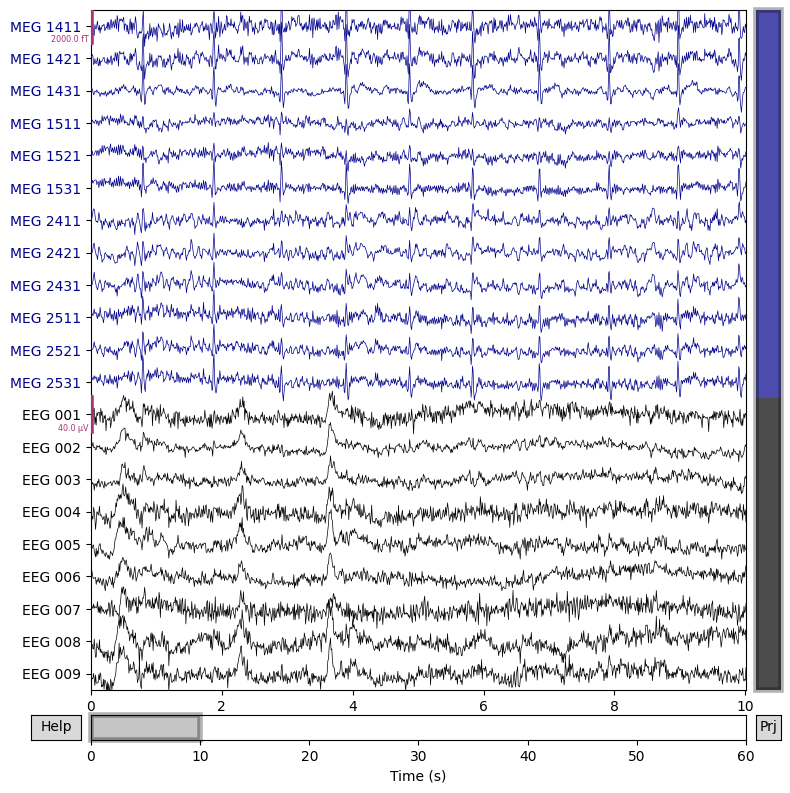

In [317]:
# 观察数据前后的差异
raw.del_proj()
# 没有添加投影消除ECG的数据
raw.plot(order=artifact_picks, n_channels=len(artifact_picks))
# 添加SSP投影
raw.add_proj(eog_projs, remove_existing=False)
# 添加投影后ECG影响被消除了
fig = raw.plot(order=artifact_picks, n_channels=len(artifact_picks))
# 发现毛刺减小

### 关于投影数量的选择

Running EOG SSP computation
Using EOG channel: EOG 061
EOG channel index for this subject is: [375]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel EOG 061 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1000 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 10 significant peaks
Number of EOG events detected: 10
Computing projector
Filtering a subset of channels. The highpass and lowpass values in the measurement info will not be updated.
Filtering raw data in 1 contiguous segment

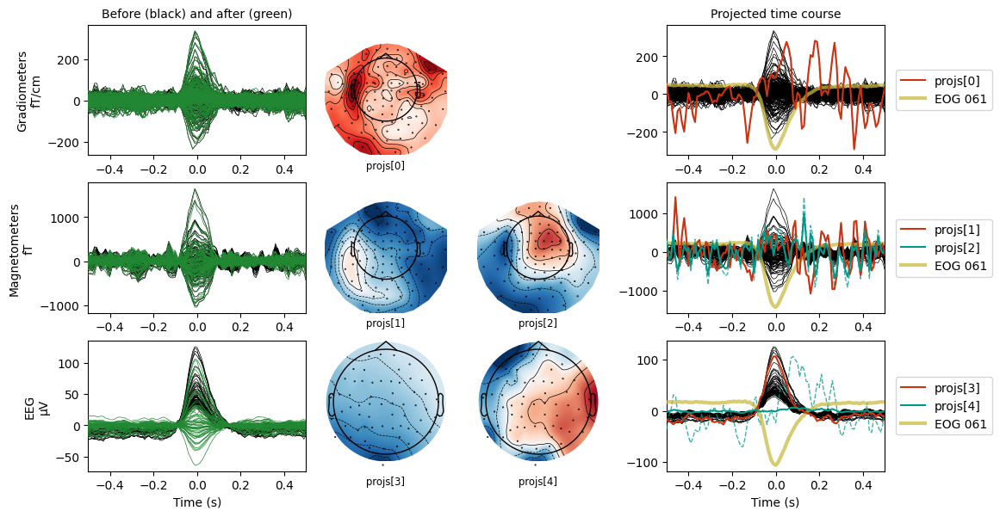

Text(0.5, 0.98, 'Too many EOG projectors')

In [323]:
# 承接上面的分析，如果我们选了一共五个投影来修复EOG
eog_projs_bad, _ = compute_proj_eog(raw, n_grad=1, n_mag=2, n_eeg=2, reject=None, no_proj=True)
fig = mne.viz.plot_projs_joint(eog_projs_bad, eog_evoked, picks_trace="eog")
fig.suptitle("Too many EOG projectors")
# 发现修复效果不好，说明投影数量并不是越多越好